In [1]:
%matplotlib inline

import os

import IPython.display as ipd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as skl
import sklearn.utils, sklearn.preprocessing, sklearn.decomposition, sklearn.svm
import librosa
import librosa.display

import keras
from keras.layers import Activation, Dense, Conv1D, Conv2D, MaxPooling1D, Flatten, Reshape

from sklearn.utils import shuffle
from sklearn.preprocessing import MultiLabelBinarizer, LabelEncoder, LabelBinarizer, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.multiclass import OneVsRestClassifier

import utils

plt.rcParams['figure.figsize'] = (17, 5)

In [2]:
# Directory where mp3 are stored.
#AUDIO_DIR = os.environ.get('AUDIO_DIR')

# Load metadata and features.
tracks = utils.load('data/tracks.csv')
genres = utils.load('data/genres.csv')
features = utils.load('data/features.csv')
echonest = utils.load('data/echonest.csv')

np.testing.assert_array_equal(features.index, tracks.index)
assert echonest.index.isin(tracks.index).all()

tracks.shape, genres.shape, features.shape, echonest.shape

((106574, 52), (163, 4), (106574, 518), (13129, 249))

## 1 Metadata


In [3]:
ipd.display(tracks['track'].head())
ipd.display(tracks['album'].head())
ipd.display(tracks['artist'].head())
ipd.display(tracks['set'].head())

,bit_rate,comments,composer,date_created,date_recorded,duration,favorites,genre_top,genres,genres_all,information,interest,language_code,license,listens,lyricist,number,publisher,tags,title
track_id,,,,,,,,,,,,,,,,,,,,
2,256000,0,NaN,2008-11-26 01:48:12,2008-11-26,168,2,Hip-Hop,[21],[21],NaN,4656,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1293,NaN,3,NaN,[],Food
3,256000,0,NaN,2008-11-26 01:48:14,2008-11-26,237,1,Hip-Hop,[21],[21],NaN,1470,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,514,NaN,4,NaN,[],Electric Ave
5,256000,0,NaN,2008-11-26 01:48:20,2008-11-26,206,6,Hip-Hop,[21],[21],NaN,1933,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1151,NaN,6,NaN,[],This World
10,192000,0,Kurt Vile,2008-11-25 17:49:06,2008-11-26,161,178,Pop,[10],[10],NaN,54881,en,Attribution-NonCommercial-NoDerivatives (aka M...,50135,NaN,1,NaN,[],Freeway
20,256000,0,NaN,2008-11-26 01:48:56,2008-01-01,311,0,NaN,"[76, 103]","[17, 10, 76, 103]",NaN,978,en,Attribution-NonCommercial-NoDerivatives (aka M...,361,NaN,3,NaN,[],Spiritual Level


,comments,date_created,date_released,engineer,favorites,id,information,listens,producer,tags,title,tracks,type
track_id,,,,,,,,,,,,,
2,0,2008-11-26 01:44:45,2009-01-05,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album
3,0,2008-11-26 01:44:45,2009-01-05,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album
5,0,2008-11-26 01:44:45,2009-01-05,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album
10,0,2008-11-26 01:45:08,2008-02-06,NaN,4,6,NaN,47632,NaN,[],Constant Hitmaker,2,Album
20,0,2008-11-26 01:45:05,2009-01-06,NaN,2,4,"<p> ""spiritual songs"" from Nicky Cook</p>",2710,NaN,[],Niris,13,Album


,active_year_begin,active_year_end,associated_labels,bio,comments,date_created,favorites,id,latitude,location,longitude,members,name,related_projects,tags,website,wikipedia_page
track_id,,,,,,,,,,,,,,,,,
2,2006-01-01,NaT,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.058324,New Jersey,-74.405661,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,[awol],http://www.AzillionRecords.blogspot.com,NaN
3,2006-01-01,NaT,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.058324,New Jersey,-74.405661,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,[awol],http://www.AzillionRecords.blogspot.com,NaN
5,2006-01-01,NaT,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.058324,New Jersey,-74.405661,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,[awol],http://www.AzillionRecords.blogspot.com,NaN
10,NaT,NaT,"Mexican Summer, Richie Records, Woodsist, Skul...","<p><span style=""font-family:Verdana, Geneva, A...",3,2008-11-26 01:42:55,74,6,NaN,NaN,NaN,"Kurt Vile, the Violators",Kurt Vile,NaN,"[philly, kurt vile]",http://kurtvile.com,NaN
20,1990-01-01,2011-01-01,NaN,<p>Songs written by: Nicky Cook</p>\n<p>VOCALS...,2,2008-11-26 01:42:52,10,4,51.895927,Colchester England,0.891874,Nicky Cook\n,Nicky Cook,NaN,"[instrumentals, experimental pop, post punk, e...",NaN,NaN


,split,subset
track_id,,
2,training,small
3,training,medium
5,training,small
10,training,small
20,training,large


In [4]:
#tracks.info()
tracks.iloc[:, [39]].value_counts()

(track, genre_top) 
Rock                   14182
Experimental           10608
Electronic              9372
Hip-Hop                 3552
Folk                    2803
Pop                     2332
Instrumental            2079
International           1389
Classical               1230
Jazz                     571
Old-Time / Historic      554
Spoken                   423
Country                  194
Soul-RnB                 175
Blues                    110
Easy Listening            24
dtype: int64

In [5]:
#finding NA rows
tracks.isna().sum(axis=0)

album   comments                  0
        date_created           3529
        date_released         36280
        engineer              91279
        favorites                 0
        id                        0
        information           23425
        listens                   0
        producer              88514
        tags                      0
        title                  1025
        tracks                    0
        type                   6508
artist  active_year_begin     83863
        active_year_end      101199
        associated_labels     92303
        bio                   35418
        comments                  0
        date_created            856
        favorites                 0
        id                        0
        latitude              62030
        location              36364
        longitude             62030
        members               59725
        name                      0
        related_projects      93422
        tags                

In [6]:
#drop rows with genre_top = NA
tracks_nona = tracks.dropna(axis=0, how="all", subset=[('track', 'genre_top')])
tracks_nona.isna().sum(axis=0)

album   comments                 0
        date_created          1051
        date_released        16086
        engineer             40687
        favorites                0
        id                       0
        information          10154
        listens                  0
        producer             39372
        tags                     0
        title                  309
        tracks                   0
        type                  2047
artist  active_year_begin    40016
        active_year_end      47200
        associated_labels    43455
        bio                  16194
        comments                 0
        date_created           215
        favorites                0
        id                       0
        latitude             28618
        location             17488
        longitude            28618
        members              27653
        name                     0
        related_projects     44233
        tags                     0
        website     

In [7]:
#split dataset size and type
import pandas as pd
pd.options.mode.chained_assignment = None 

df_small = tracks_nona[tracks_nona['set', 'subset'] == 'small']
df_medium = tracks_nona[tracks_nona['set', 'subset'] == 'medium']
df_large = tracks_nona[tracks_nona['set', 'subset'] == 'large']

df_train = tracks_nona[tracks_nona['set', 'split'] == 'training']
df_test = tracks_nona[tracks_nona['set', 'split'] == 'test']
df_validation = tracks_nona[tracks_nona['set', 'split'] == 'validation']

In [8]:
print(df_small.shape)
print(df_medium.shape)
print(df_large.shape)

print(df_train.shape)
print(df_test.shape)
print(df_validation.shape)

(8000, 52)
(17000, 52)
(24598, 52)
(39943, 52)
(4951, 52)
(4704, 52)


In [9]:
import collections
#from imblearn.over_sampling import RandomOverSampler

'''
parent_genre = [2,3,4,5,8,9,10,12,13,14,15,17,20,21,38,1235]
def map_genre_nan(genres_all):
    genre_id = 'NaN'
    for i in genres_all:
        if i in parent_genre:
            genre_id = i
            break
    return genre_id
'''

def map_genre_id(genre_top):
    genre_id = genres[genres.title==genre_top].index.values.astype(int)[0]
    return genre_id

def preprocess_track(df):
    df['album', 'date_created'] = pd.DatetimeIndex(df.album.date_created).year
    df['artist', 'date_created'] = pd.DatetimeIndex(df.artist.date_created).year
    df['track', 'date_created'] = pd.DatetimeIndex(df.track.date_created).year
    
    df = df.drop(['date_released', 'engineer', 'information', 'producer', 'title', 'type'], axis=1, level=1)
    df = df.drop(['active_year_begin', 'active_year_end', 'associated_labels', 'bio', 'latitude', 'location', 'longitude', 'members', 'name', 'related_projects', 'website', 'wikipedia_page'], axis=1, level=1)
    df = df.drop(['composer', 'date_recorded', 'information', 'language_code', 'lyricist', 'number', 'publisher', 'title'], axis=1, level=1)
    df = df.drop(['tags', 'license', 'date_created'], axis=1, level=1)
    df = df.drop(['set'], axis=1, level=0)
    df = df.dropna(axis=0, how="any", subset=[('track', 'genre_top')])
    
    #map genre_top to genre_id
    df['track', 'genre_top_id'] = df.track['genre_top'].apply(map_genre_id)
    #df['track', 'genre_top_id'] = df[df.track['genre_top'].isnull()].track['genres_all'].apply(map_genre_nan)
    return df

#def oversampling(X, y):
#    print('before oversampling:', collections.Counter(y))
#   oversample = RandomOverSampler(sampling_strategy='auto')
#  X_over, y_over = oversample.fit_resample(X, y)
# a = np.array(y_over)
#print('after oversampling:', collections.Counter(a))
    
    #y_over = pd.Series(y_over)
    #return X_over, y_over

In [10]:
df_small = preprocess_track(df_small)
df_medium = preprocess_track(df_medium)
df_large = preprocess_track(df_large)

df_train = preprocess_track(df_train)
df_test = preprocess_track(df_test)
df_validation = preprocess_track(df_validation)

In [11]:
print(df_small.shape)
print(df_medium.shape)
print(df_large.shape)

print(df_train.shape)
print(df_test.shape)
print(df_validation.shape)

(8000, 18)
(17000, 18)
(24598, 18)
(39943, 18)
(4951, 18)
(4704, 18)


In [12]:
df_features = features

In [13]:
def preprocess_features(df):
    # Add genre_top_id to df_features
    df_tracks = tracks
    df_tracks['track', 'genre_top_id'] = df_tracks.track['genre_top'].apply(map_genre_id)
    
    genre_top = df_tracks.track.genre_top
    split = df_tracks.set.split
    subset = df_tracks.set.subset
    df = pd.concat([df, genre_top, split, subset], axis=1)
    df = df.dropna(subset=['genre_top'])
    
    counts = df['genre_top'].value_counts()
    df = df[~df['genre_top'].isin(counts[counts < 1000].index)]
    
    return df

In [14]:
df_features = preprocess_features(df_features)
df_features

,"(chroma_cens, kurtosis, 01)","(chroma_cens, kurtosis, 02)","(chroma_cens, kurtosis, 03)","(chroma_cens, kurtosis, 04)","(chroma_cens, kurtosis, 05)","(chroma_cens, kurtosis, 06)","(chroma_cens, kurtosis, 07)","(chroma_cens, kurtosis, 08)","(chroma_cens, kurtosis, 09)","(chroma_cens, kurtosis, 10)",...,"(zcr, kurtosis, 01)","(zcr, max, 01)","(zcr, mean, 01)","(zcr, median, 01)","(zcr, min, 01)","(zcr, skew, 01)","(zcr, std, 01)",genre_top,split,subset
track_id,,,,,,,,,,,,,,,,,,,,,
2,7.180653,5.230309,0.249321,1.347620,1.482478,0.531371,1.481593,2.691455,0.866868,1.341231,...,5.758890,0.459473,0.085629,0.071289,0.000000,2.089872,0.061448,Hip-Hop,training,small
3,1.888963,0.760539,0.345297,2.295201,1.654031,0.067592,1.366848,1.054094,0.108103,0.619185,...,2.824694,0.466309,0.084578,0.063965,0.000000,1.716724,0.069330,Hip-Hop,training,medium
5,0.527563,-0.077654,-0.279610,0.685883,1.937570,0.880839,-0.923192,-0.927232,0.666617,1.038546,...,6.808415,0.375000,0.053114,0.041504,0.000000,2.193303,0.044861,Hip-Hop,training,small
10,3.702245,-0.291193,2.196742,-0.234449,1.367364,0.998411,1.770694,1.604566,0.521217,1.982386,...,21.434212,0.452148,0.077515,0.071777,0.000000,3.542325,0.040800,Pop,training,small
134,0.918445,0.674147,0.577818,1.281117,0.933746,0.078177,1.199204,-0.175223,0.925482,1.438509,...,4.731087,0.419434,0.064370,0.050781,0.000000,1.806106,0.054623,Hip-Hop,training,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155315,-0.319850,0.653044,1.300360,-0.606061,-1.109302,-1.006683,0.059643,0.472580,-0.856436,-0.524676,...,6.947788,0.188477,0.037708,0.035156,0.002930,1.764233,0.018679,Rock,training,large
155316,-0.490129,0.463834,2.321970,-0.084352,1.662914,2.115189,-0.237794,5.695442,0.830353,1.951819,...,4.448255,0.172852,0.028773,0.028320,0.003906,0.955388,0.012385,Rock,training,large
155317,-0.461559,-0.229601,-0.496632,-0.422033,0.130612,-0.263825,-0.628103,-0.082687,-0.229483,-0.492753,...,3.270612,0.196289,0.031116,0.027832,0.002441,1.283060,0.019059,Rock,training,large


In [15]:
# Drop track id column
features = df_features.reset_index(drop=True)
features

,"(chroma_cens, kurtosis, 01)","(chroma_cens, kurtosis, 02)","(chroma_cens, kurtosis, 03)","(chroma_cens, kurtosis, 04)","(chroma_cens, kurtosis, 05)","(chroma_cens, kurtosis, 06)","(chroma_cens, kurtosis, 07)","(chroma_cens, kurtosis, 08)","(chroma_cens, kurtosis, 09)","(chroma_cens, kurtosis, 10)",...,"(zcr, kurtosis, 01)","(zcr, max, 01)","(zcr, mean, 01)","(zcr, median, 01)","(zcr, min, 01)","(zcr, skew, 01)","(zcr, std, 01)",genre_top,split,subset
0,7.180653,5.230309,0.249321,1.347620,1.482478,0.531371,1.481593,2.691455,0.866868,1.341231,...,5.758890,0.459473,0.085629,0.071289,0.000000,2.089872,0.061448,Hip-Hop,training,small
1,1.888963,0.760539,0.345297,2.295201,1.654031,0.067592,1.366848,1.054094,0.108103,0.619185,...,2.824694,0.466309,0.084578,0.063965,0.000000,1.716724,0.069330,Hip-Hop,training,medium
2,0.527563,-0.077654,-0.279610,0.685883,1.937570,0.880839,-0.923192,-0.927232,0.666617,1.038546,...,6.808415,0.375000,0.053114,0.041504,0.000000,2.193303,0.044861,Hip-Hop,training,small
3,3.702245,-0.291193,2.196742,-0.234449,1.367364,0.998411,1.770694,1.604566,0.521217,1.982386,...,21.434212,0.452148,0.077515,0.071777,0.000000,3.542325,0.040800,Pop,training,small
4,0.918445,0.674147,0.577818,1.281117,0.933746,0.078177,1.199204,-0.175223,0.925482,1.438509,...,4.731087,0.419434,0.064370,0.050781,0.000000,1.806106,0.054623,Hip-Hop,training,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47542,-0.319850,0.653044,1.300360,-0.606061,-1.109302,-1.006683,0.059643,0.472580,-0.856436,-0.524676,...,6.947788,0.188477,0.037708,0.035156,0.002930,1.764233,0.018679,Rock,training,large
47543,-0.490129,0.463834,2.321970,-0.084352,1.662914,2.115189,-0.237794,5.695442,0.830353,1.951819,...,4.448255,0.172852,0.028773,0.028320,0.003906,0.955388,0.012385,Rock,training,large
47544,-0.461559,-0.229601,-0.496632,-0.422033,0.130612,-0.263825,-0.628103,-0.082687,-0.229483,-0.492753,...,3.270612,0.196289,0.031116,0.027832,0.002441,1.283060,0.019059,Rock,training,large
47545,0.552473,-0.110498,-0.532014,0.263131,-0.224011,-0.530972,1.713526,1.418444,1.325197,0.120333,...,2.356727,0.212891,0.038450,0.037109,0.003418,0.828569,0.017904,Rock,training,large


In [19]:
# Define our features
features = df_features.drop(columns=['genre_top','split','subset'])

# Define our labels
labels = df_features['genre_top']

# Import the StandardScaler
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Scale the features and set the values to a new variable
scaler = StandardScaler()
scaled_train_features = scaler.fit_transform(features)

In [17]:
#split dataset size and type
pd.options.mode.chained_assignment = None 

df_small = df_features[df_features['subset'] == 'small']
df_medium = df_features[df_features['subset'] == 'medium']
df_large = df_features[df_features['subset'] == 'large']

df_train = df_features[df_features['split'] == 'training']
df_test = df_features[df_features['split'] == 'test']
df_validation = df_features[df_features['split'] == 'validation']

print(df_small.shape)
print(df_medium.shape)
print(df_large.shape)

print(df_train.shape)
print(df_test.shape)
print(df_validation.shape)

(8000, 521)
(15561, 521)
(23986, 521)
(38385, 521)
(4738, 521)
(4424, 521)


In [18]:
from sklearn import model_selection, metrics

X = df_features.drop(columns=['genre_top','split','subset'])
y = df_features['genre_top']
feature_train_full, feature_test_full, label_train_full, label_test_full = model_selection.train_test_split(X, y)

In [19]:
# Import the StandardScaler
from sklearn.preprocessing import StandardScaler

# Scale the features and set the values to a new variable
scaler = StandardScaler()
scaled_train_features = scaler.fit_transform(feature_train_full)

In [20]:
# using dataset split (full)
# Import train_test_split function and Decision tree classifier
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

# Split our data
#train_features, test_features, train_labels, test_labels = train_test_split(features, labels, random_state=10)

# Train our decision tree
#tree_full = DecisionTreeClassifier(random_state=10)
#tree_full.fit(scaled_train_features, label_train_full)

# Predict the labels for the test data
#pred_labels_tree_full = tree_full.predict(feature_test_full)

In [21]:
#tree_full.get_params()

In [22]:
labelNames = ['Rock', 'Experimental', 'Electronic', 'Hip-Hop', 'Folk', 'Pop', 'Instrumental', 'International', 'Classical']
labelNames.sort()

In [23]:
from sklearn import tree
fig = plt.figure(figsize=(25,20))
#_ = tree.plot_tree(tree_full,
#                   feature_names=feature_train_full.columns,
 #                  class_names=labelNames,
 #                  filled=True)

<Figure size 1800x1440 with 0 Axes>

default tree is overfitting

In [24]:
# Train our decision tree with max depth = 5
tree_full_md5 = DecisionTreeClassifier(max_depth = 5, random_state=10)
tree_full_md5.fit(feature_train_full, label_train_full)

# Predict the labels for the test data
pred_labels_tree_md5 = tree_full_md5.predict(feature_test_full)


In [25]:
fig = plt.figure(figsize=(200,160))
_ = tree.plot_tree(tree_full_md5,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

In [26]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(label_test_full, pred_labels_tree_md5)

In [27]:
from itertools import product

def plot_confusion_matrix(cm, names, title='DT Confusion Matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(names))
    plt.xticks(tick_marks, names, rotation=90)
    plt.yticks(tick_marks, names)
    
    for i, j in product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
        horizontalalignment="center",
        color="white" if cm[i, j] > 500 else "black")
    
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

[[ 132    7  150    6    2    0    1    0   11]
 [  15 1127  511   58  320    0    6    0  314]
 [  62  522 1228   94  141    0   19    0  589]
 [  21  101  176  195   56    0    9    0  150]
 [   1  239   85   19  413    0    3    0  111]
 [  25   96  284   26   13    0    4    0   75]
 [   1   45   94   30   44    0   36    0   83]
 [   7  104  176   40   65    0    4    0  202]
 [   6  280  443   48  153    0    8    0 2601]]


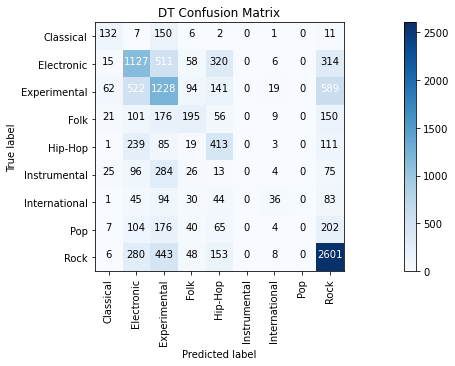

In [28]:
print(confusion_matrix)
plt.figure()
plot_confusion_matrix(confusion_matrix, labelNames)
plt.show()

In [29]:
import sklearn.metrics as metrics

print('full tree accuracy:', metrics.accuracy_score(label_test_full, pred_labels_tree_md5))
print('full tree precision:', metrics.precision_score(label_test_full, pred_labels_tree_md5, average='weighted'))
print('full tree recall:', metrics.recall_score(label_test_full, pred_labels_tree_md5, average='weighted'))
print('full tree f1 score:', metrics.f1_score(label_test_full, pred_labels_tree_md5, average='weighted'))

full tree accuracy: 0.4822074535206528
full tree precision: 0.4342928085799671
full tree recall: 0.4822074535206528
full tree f1 score: 0.452562023567635


C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [30]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

ovr_tree_full = OneVsRestClassifier(tree_full_md5)

ovr_tree_full.fit(feature_train_full, label_train_full)

label_pred_ovr_tree_full = ovr_tree_full.predict(feature_test_full)
label_pred_ovr_tree_probability = ovr_tree_full.predict_proba(feature_test_full)

In [31]:
fpr = {}
tpr = {}
thresh ={}

n_class = 9

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(label_test_full, label_pred_ovr_tree_probability[:,i], pos_label=labelNames[i])

In [32]:
print(labelNames)

['Classical', 'Electronic', 'Experimental', 'Folk', 'Hip-Hop', 'Instrumental', 'International', 'Pop', 'Rock']


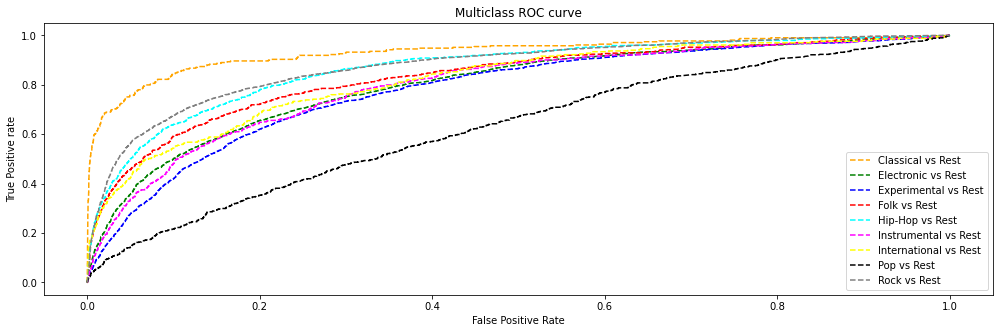

In [33]:
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Classical vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Electronic vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Experimental vs Rest')
plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label='Folk vs Rest')
plt.plot(fpr[4], tpr[4], linestyle='--',color='cyan', label='Hip-Hop vs Rest')
plt.plot(fpr[5], tpr[5], linestyle='--',color='magenta', label='Instrumental vs Rest')
plt.plot(fpr[6], tpr[6], linestyle='--',color='yellow', label='International vs Rest')
plt.plot(fpr[7], tpr[7], linestyle='--',color='black', label='Pop vs Rest')
plt.plot(fpr[8], tpr[8], linestyle='--',color='grey', label='Rock vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300);

In [34]:
auc_score = roc_auc_score(label_test_full, label_pred_ovr_tree_probability, multi_class = 'ovr')
print(auc_score)

0.8143816015587602


## Random Oversampling

In [35]:
#!pip install imblearn

In [36]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

In [37]:
oversampler = RandomOverSampler(random_state = 10)
oversample_feature_train, oversample_label_train = oversampler.fit_resample(feature_train_full, label_train_full)

In [38]:
# Train our decision tree with max depth = 5
tree_full_oversample = DecisionTreeClassifier(max_depth = 5, random_state=10)
tree_full_oversample.fit(oversample_feature_train, oversample_label_train)

# Predict the labels for the test data
pred_labels_tree_oversample = tree_full_oversample.predict(feature_test_full)

In [39]:
from sklearn import tree
fig = plt.figure(figsize=(200,160))
_ = tree.plot_tree(tree_full_oversample,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

In [40]:
oversample_confusion_matrix = metrics.confusion_matrix(label_test_full,pred_labels_tree_oversample)

[[ 132    7  150    6    2    0    1    0   11]
 [  15 1127  511   58  320    0    6    0  314]
 [  62  522 1228   94  141    0   19    0  589]
 [  21  101  176  195   56    0    9    0  150]
 [   1  239   85   19  413    0    3    0  111]
 [  25   96  284   26   13    0    4    0   75]
 [   1   45   94   30   44    0   36    0   83]
 [   7  104  176   40   65    0    4    0  202]
 [   6  280  443   48  153    0    8    0 2601]]


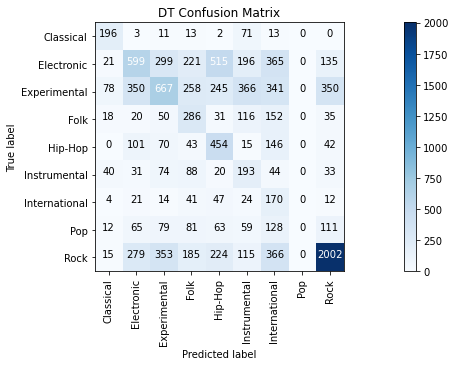

In [41]:
print(confusion_matrix)
plt.figure()
plot_confusion_matrix(oversample_confusion_matrix, labelNames)
plt.show()

In [42]:
print('oversample tree accuracy:', metrics.accuracy_score(label_test_full, pred_labels_tree_oversample))
print('oversample tree precision:', metrics.precision_score(label_test_full, pred_labels_tree_oversample, average='weighted'))
print('oversample tree recall:', metrics.recall_score(label_test_full, pred_labels_tree_oversample, average='weighted'))
print('oversample tree f1 score:', metrics.f1_score(label_test_full, pred_labels_tree_oversample, average='weighted'))

oversample tree accuracy: 0.38420122823252295
oversample tree precision: 0.45007660066961913
oversample tree recall: 0.38420122823252295
oversample tree f1 score: 0.39630369877113375


C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [43]:
ovr_tree_oversample = OneVsRestClassifier(tree_full_oversample)

ovr_tree_oversample.fit(oversample_feature_train, oversample_label_train)

label_pred_ovr_tree_oversample = ovr_tree_oversample.predict(feature_test_full)
label_pred_ovr_treeos_probability = ovr_tree_oversample.predict_proba(feature_test_full)

In [44]:
auc_score = roc_auc_score(label_test_full, label_pred_ovr_treeos_probability, multi_class = 'ovr')
print(auc_score)

0.8100128974106607


## Random undersampling

In [45]:
undersampler = RandomUnderSampler(random_state = 10)
undersample_feature_train, undersample_label_train = undersampler.fit_resample(feature_train_full, label_train_full)

In [46]:
# Train our decision tree with max depth = 5
tree_full_undersample = DecisionTreeClassifier(max_depth = 5, random_state=10)
tree_full_undersample.fit(undersample_feature_train, undersample_label_train)

# Predict the labels for the test data
pred_labels_tree_undersample = tree_full_undersample.predict(feature_test_full)

In [47]:
from sklearn import tree
fig = plt.figure(figsize=(200,160))
_ = tree.plot_tree(tree_full_undersample,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

[[ 132    7  150    6    2    0    1    0   11]
 [  15 1127  511   58  320    0    6    0  314]
 [  62  522 1228   94  141    0   19    0  589]
 [  21  101  176  195   56    0    9    0  150]
 [   1  239   85   19  413    0    3    0  111]
 [  25   96  284   26   13    0    4    0   75]
 [   1   45   94   30   44    0   36    0   83]
 [   7  104  176   40   65    0    4    0  202]
 [   6  280  443   48  153    0    8    0 2601]]


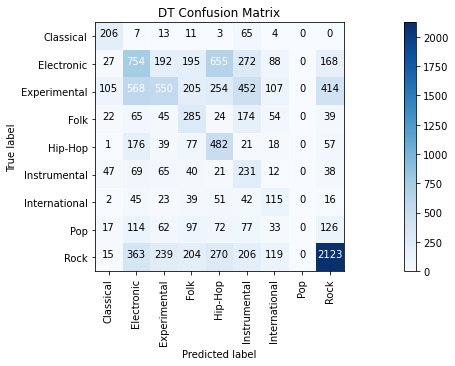

In [48]:
undersample_confusion_matrix = metrics.confusion_matrix(label_test_full,pred_labels_tree_undersample)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(undersample_confusion_matrix, labelNames)
plt.show()

In [49]:
print('undersample tree accuracy:', metrics.accuracy_score(label_test_full, pred_labels_tree_undersample))
print('undersample tree precision:', metrics.precision_score(label_test_full, pred_labels_tree_undersample, average='weighted'))
print('undersample tree recall:', metrics.recall_score(label_test_full, pred_labels_tree_undersample, average='weighted'))
print('undersample tree f1 score:', metrics.f1_score(label_test_full, pred_labels_tree_undersample, average='weighted'))

undersample tree accuracy: 0.3992596954656347
undersample tree precision: 0.43964604571274046
undersample tree recall: 0.3992596954656347
undersample tree f1 score: 0.39904375397683434


C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [50]:
ovr_tree_undersample = OneVsRestClassifier(tree_full_undersample)

ovr_tree_undersample.fit(undersample_feature_train, undersample_label_train)

label_pred_ovr_tree_undersample = ovr_tree_undersample.predict(feature_test_full)
label_pred_ovr_treeus_probability = ovr_tree_undersample.predict_proba(feature_test_full)

In [51]:
auc_score = roc_auc_score(label_test_full, label_pred_ovr_treeus_probability, multi_class = 'ovr')
print(auc_score)

0.7874031883545044


## PCA

Text(0.5, 0, 'Principal Component #')

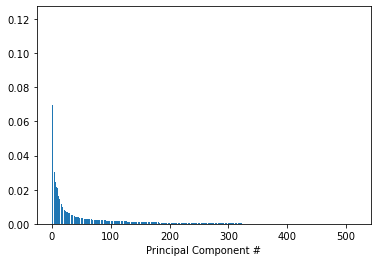

In [52]:
# This is just to make plots appear in the notebook
%matplotlib inline

# Import our plotting module, and PCA class
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Get our explained variance ratios from PCA using all features
pca = PCA()
pca.fit(scaled_train_features)
exp_variance = pca.explained_variance_ratio_

# plot the explained variance using a barplot
fig, ax = plt.subplots()
ax.bar(range(pca.n_components_), exp_variance)
ax.set_xlabel('Principal Component #')

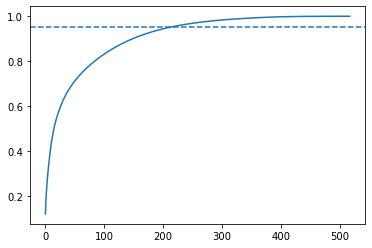

In [53]:
# Calculate the cumulative explained variance
cum_exp_variance = np.cumsum(exp_variance)

# Plot the cumulative explained variance and draw a dashed line at 0.85.
fig, ax = plt.subplots()
ax.plot(cum_exp_variance)
ax.axhline(y=0.95, linestyle='--')

# choose the n_components where about 95% of our variance can be explained
n_components = 216

# Perform PCA with the chosen number of components and project data onto components
pca = PCA(n_components, random_state=10)
pca.fit(scaled_train_features)
pca_projection = pca.transform(scaled_train_features)

In [54]:
# Scale the features and set the values to a new variable
scaler = StandardScaler()
#scaled_train_features = scaler.fit_transform(feature_train_full)
scaled_test_features = scaler.fit_transform(feature_test_full)

In [156]:
initial_feature_names = list(feature_test_full.columns)

In [55]:
pca = PCA(n_components = 0.95)
pca.fit(scaled_train_features)
reduced_train_features = pca.transform(scaled_train_features)
reduced_test_features = pca.transform(scaled_test_features)

In [162]:
# number of components
n_pcs= pca.components_.shape[0]

# get the index of the most important feature on EACH component
# LIST COMPREHENSION HERE
most_important = [np.abs(pca.components_[i]).argmax() for i in range(n_pcs)]

#initial_feature_names = ['a','b','c','d','e']
# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]

# LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

# build the dataframe
df = pd.DataFrame(dic.items())

df.head(10)

,0,1
0,PC0,"(spectral_contrast, mean, 02)"
1,PC1,"(mfcc, max, 10)"
2,PC2,"(tonnetz, std, 01)"
3,PC3,"(chroma_cqt, kurtosis, 12)"
4,PC4,"(chroma_cens, mean, 02)"
5,PC5,"(chroma_cens, mean, 04)"
6,PC6,"(chroma_cqt, median, 08)"
7,PC7,"(chroma_cens, mean, 06)"
8,PC8,"(chroma_cens, mean, 01)"
9,PC9,"(chroma_cens, mean, 08)"


In [ ]:
## Calculating feature importance
feat_importance = tree_pcahyper.tree_.compute_feature_importances(normalize=False)
feat_imp_dict = dict(zip(feature_train_full, tree_pcahyper.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.rename(columns = {0:'FeatureImportance'}, inplace = True)
feat_imp.sort_values(by=['FeatureImportance'], ascending=False).head()

In [56]:
# Train our decision tree with max depth = 5
tree_pca = DecisionTreeClassifier(max_depth = 5, random_state=10)
tree_pca.fit(reduced_train_features, label_train_full)

# Predict the labels for the test data
pred_labels_tree_pca = tree_pca.predict(reduced_test_features)

[[ 132    7  150    6    2    0    1    0   11]
 [  15 1127  511   58  320    0    6    0  314]
 [  62  522 1228   94  141    0   19    0  589]
 [  21  101  176  195   56    0    9    0  150]
 [   1  239   85   19  413    0    3    0  111]
 [  25   96  284   26   13    0    4    0   75]
 [   1   45   94   30   44    0   36    0   83]
 [   7  104  176   40   65    0    4    0  202]
 [   6  280  443   48  153    0    8    0 2601]]


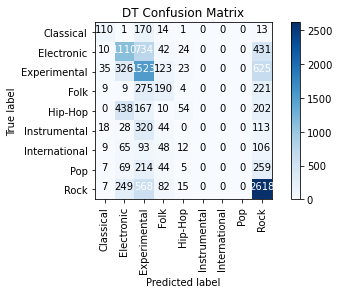

In [57]:
pca_confusion_matrix = metrics.confusion_matrix(label_test_full,pred_labels_tree_pca)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(pca_confusion_matrix, labelNames)
plt.show()

In [58]:
print('pca tree accuracy:', metrics.accuracy_score(label_test_full, pred_labels_tree_pca))
print('pca tree precision:', metrics.precision_score(label_test_full, pred_labels_tree_pca, average='weighted'))
print('pca tree recall:', metrics.recall_score(label_test_full, pred_labels_tree_pca, average='weighted'))
print('pca tree f1 score:', metrics.f1_score(label_test_full, pred_labels_tree_pca, average='weighted'))

pca tree accuracy: 0.47152351308151763
pca tree precision: 0.41082147983893164
pca tree recall: 0.47152351308151763
pca tree f1 score: 0.4238854409008856


C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [59]:
ovr_tree_pca = OneVsRestClassifier(tree_pca)

ovr_tree_pca.fit(reduced_train_features, label_train_full)

label_pred_ovr_tree_pca = ovr_tree_pca.predict(reduced_test_features)
label_pred_ovr_treepca_probability = ovr_tree_pca.predict_proba(reduced_test_features)

In [60]:
auc_score = roc_auc_score(label_test_full, label_pred_ovr_treepca_probability, multi_class = 'ovr')
print(auc_score)

0.792984599437074


## Oversample + PCA

In [61]:
# Scale the features and set the values to a new variable
scaler = StandardScaler()
scaled_train_features2 = scaler.fit_transform(oversample_feature_train)
#scaled_test_features = scaler.fit_transform(feature_test_full)

In [62]:
pca = PCA(n_components = 0.95)
pca.fit(scaled_train_features)
reduced_train_features2 = pca.transform(scaled_train_features2)
#reduced_test_features = pca.transform(scaled_test_features)

In [63]:
# Train our decision tree with max depth = 5
treeos_pca = DecisionTreeClassifier(max_depth = 5, random_state=10)
treeos_pca.fit(reduced_train_features2, oversample_label_train)

# Predict the labels for the test data
pred_labels_treeos_pca = tree_pca.predict(reduced_test_features)

[[ 132    7  150    6    2    0    1    0   11]
 [  15 1127  511   58  320    0    6    0  314]
 [  62  522 1228   94  141    0   19    0  589]
 [  21  101  176  195   56    0    9    0  150]
 [   1  239   85   19  413    0    3    0  111]
 [  25   96  284   26   13    0    4    0   75]
 [   1   45   94   30   44    0   36    0   83]
 [   7  104  176   40   65    0    4    0  202]
 [   6  280  443   48  153    0    8    0 2601]]


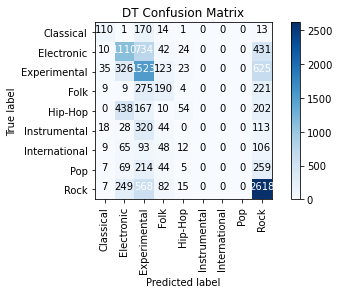

In [64]:
pca_confusion_matrix = metrics.confusion_matrix(label_test_full,pred_labels_treeos_pca)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(pca_confusion_matrix, labelNames)
plt.show()

In [65]:
print('pca treeos accuracy:', metrics.accuracy_score(label_test_full, pred_labels_treeos_pca))
print('pca treeos precision:', metrics.precision_score(label_test_full, pred_labels_treeos_pca, average='weighted'))
print('pca treeos recall:', metrics.recall_score(label_test_full, pred_labels_treeos_pca, average='weighted'))
print('pca treeos f1 score:', metrics.f1_score(label_test_full, pred_labels_treeos_pca, average='weighted'))

pca treeos accuracy: 0.47152351308151763
pca treeos precision: 0.41082147983893164
pca treeos recall: 0.47152351308151763
pca treeos f1 score: 0.4238854409008856


C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [66]:
ovr_treeos_pca = OneVsRestClassifier(treeos_pca)

ovr_treeos_pca.fit(reduced_train_features2, oversample_label_train)

label_pred_ovr_treeos_pca = ovr_treeos_pca.predict(reduced_test_features)
label_pred_ovr_treeospca_probability = ovr_treeos_pca.predict_proba(reduced_test_features)

In [67]:
auc_score = roc_auc_score(label_test_full, label_pred_ovr_treeospca_probability, multi_class = 'ovr')
print(auc_score)

0.7741161505339985


## Undersample + PCA

In [68]:
# Scale the features and set the values to a new variable
scaler = StandardScaler()
scaled_train_features3 = scaler.fit_transform(undersample_feature_train)
#scaled_test_features = scaler.fit_transform(feature_test_full)

In [69]:
pca = PCA(n_components = 0.95)
pca.fit(scaled_train_features)
reduced_train_features3 = pca.transform(scaled_train_features3)
#reduced_test_features = pca.transform(scaled_test_features)

In [70]:
# Train our decision tree with max depth = 5
treeus_pca = DecisionTreeClassifier(max_depth = 5, random_state=10)
treeus_pca.fit(reduced_train_features3, undersample_label_train)

# Predict the labels for the test data
pred_labels_treeus_pca = tree_pca.predict(reduced_test_features)

[[ 132    7  150    6    2    0    1    0   11]
 [  15 1127  511   58  320    0    6    0  314]
 [  62  522 1228   94  141    0   19    0  589]
 [  21  101  176  195   56    0    9    0  150]
 [   1  239   85   19  413    0    3    0  111]
 [  25   96  284   26   13    0    4    0   75]
 [   1   45   94   30   44    0   36    0   83]
 [   7  104  176   40   65    0    4    0  202]
 [   6  280  443   48  153    0    8    0 2601]]


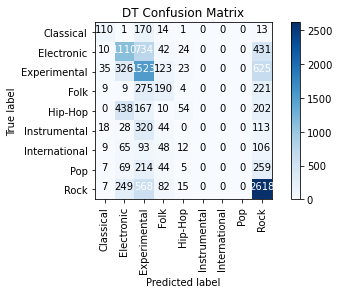

In [71]:
pca_confusion_matrix = metrics.confusion_matrix(label_test_full,pred_labels_treeus_pca)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(pca_confusion_matrix, labelNames)
plt.show()

In [72]:
print('pca treeus accuracy:', metrics.accuracy_score(label_test_full, pred_labels_treeos_pca))
print('pca treeus precision:', metrics.precision_score(label_test_full, pred_labels_treeos_pca, average='weighted'))
print('pca treeus recall:', metrics.recall_score(label_test_full, pred_labels_treeos_pca, average='weighted'))
print('pca treeus f1 score:', metrics.f1_score(label_test_full, pred_labels_treeos_pca, average='weighted'))

pca treeus accuracy: 0.47152351308151763
pca treeus precision: 0.41082147983893164
pca treeus recall: 0.47152351308151763
pca treeus f1 score: 0.4238854409008856


C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [73]:
ovr_treeus_pca = OneVsRestClassifier(treeus_pca)

ovr_treeus_pca.fit(reduced_train_features3, undersample_label_train)

label_pred_ovr_treeus_pca = ovr_treeus_pca.predict(reduced_test_features)
label_pred_ovr_treeuspca_probability = ovr_treeus_pca.predict_proba(reduced_test_features)

In [74]:
auc_score = roc_auc_score(label_test_full, label_pred_ovr_treeuspca_probability, multi_class = 'ovr')
print(auc_score)

0.7517029638364667


## Rerunnning DT model on unsampled data with best estimator

In [75]:
# Train our decision tree with best estimator
tree_pcahyper = DecisionTreeClassifier(max_depth=10, min_samples_leaf=100, random_state=10)
tree_pcahyper.fit(reduced_train_features, label_train_full)

# Predict the labels for the test data
pred_labels_tree_pcahyper = tree_pca.predict(reduced_test_features)

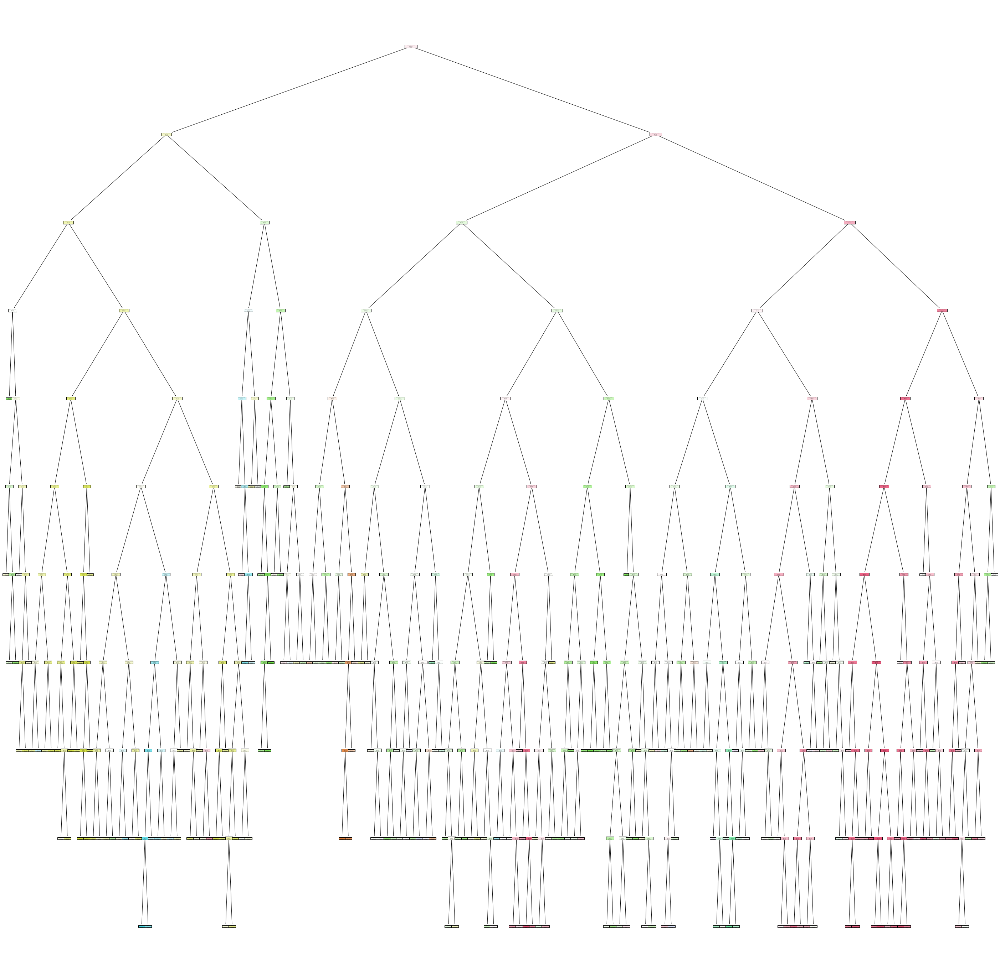

In [137]:
from sklearn import tree
fig = plt.figure(figsize=(50,50))
_ = tree.plot_tree(tree_pcahyper,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

[[ 132    7  150    6    2    0    1    0   11]
 [  15 1127  511   58  320    0    6    0  314]
 [  62  522 1228   94  141    0   19    0  589]
 [  21  101  176  195   56    0    9    0  150]
 [   1  239   85   19  413    0    3    0  111]
 [  25   96  284   26   13    0    4    0   75]
 [   1   45   94   30   44    0   36    0   83]
 [   7  104  176   40   65    0    4    0  202]
 [   6  280  443   48  153    0    8    0 2601]]


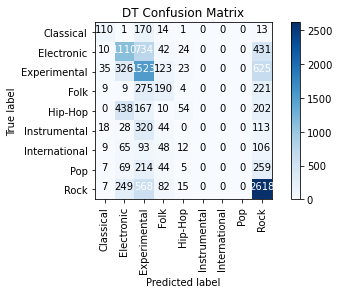

In [77]:
fullbest_confusion_matrix = metrics.confusion_matrix(label_test_full,pred_labels_tree_pcahyper)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(fullbest_confusion_matrix, labelNames)
plt.show()

In [78]:
print('fullbest tree accuracy:', metrics.accuracy_score(label_test_full, pred_labels_tree_pcahyper))
print('fullbest tree precision:', metrics.precision_score(label_test_full, pred_labels_tree_pcahyper, average='weighted'))
print('fullbest tree recall:', metrics.recall_score(label_test_full, pred_labels_tree_pcahyper, average='weighted'))
print('fullbest tree f1 score:', metrics.f1_score(label_test_full, pred_labels_tree_pcahyper, average='weighted'))

fullbest tree accuracy: 0.47152351308151763
fullbest tree precision: 0.41082147983893164
fullbest tree recall: 0.47152351308151763
fullbest tree f1 score: 0.4238854409008856


C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [79]:
ovr_tree_pcahyper = OneVsRestClassifier(tree_pcahyper)

ovr_tree_pcahyper.fit(reduced_train_features, label_train_full)

label_pred_ovr_tree_pcahyper = ovr_tree_pcahyper.predict(reduced_test_features)
label_pred_ovr_treepcahyper_probability = ovr_tree_pcahyper.predict_proba(reduced_test_features)

In [80]:
auc_score = roc_auc_score(label_test_full, label_pred_ovr_treepcahyper_probability, multi_class = 'ovr')
print(auc_score)

0.7839891979863819


In [81]:
fpr = {}
tpr = {}
thresh ={}

n_class = 9

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(label_test_full, label_pred_ovr_treepcahyper_probability[:,i], pos_label=labelNames[i])

In [82]:
print(labelNames)

['Classical', 'Electronic', 'Experimental', 'Folk', 'Hip-Hop', 'Instrumental', 'International', 'Pop', 'Rock']


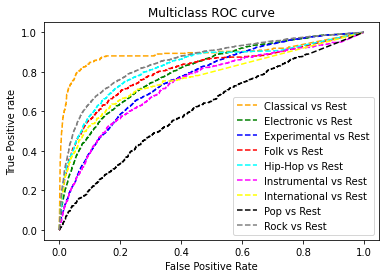

In [83]:
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Classical vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Electronic vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Experimental vs Rest')
plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label='Folk vs Rest')
plt.plot(fpr[4], tpr[4], linestyle='--',color='cyan', label='Hip-Hop vs Rest')
plt.plot(fpr[5], tpr[5], linestyle='--',color='magenta', label='Instrumental vs Rest')
plt.plot(fpr[6], tpr[6], linestyle='--',color='yellow', label='International vs Rest')
plt.plot(fpr[7], tpr[7], linestyle='--',color='black', label='Pop vs Rest')
plt.plot(fpr[8], tpr[8], linestyle='--',color='grey', label='Rock vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300);

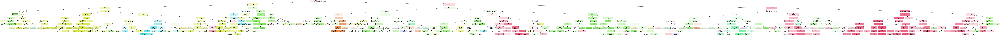

In [147]:
from io import StringIO

from sklearn.tree import export_graphviz
# from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz
xvar = reduced_pd
feature_cols = xvar.columns
dot_data = StringIO()
export_graphviz(tree_pcahyper, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=labelNames)
from pydot import graph_from_dot_data
(graph, ) = graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

## DT: Oversample + PCA + Hyper

In [118]:
# Train our decision tree with best estimator
treeos_pcahyper = DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=5, random_state=10)
treeos_pcahyper.fit(reduced_train_features2, oversample_label_train)

# Predict the labels for the test data
pred_labels_treeos_pcahyper = treeos_pcahyper.predict(reduced_test_features)

In [ ]:
from sklearn import tree
fig = plt.figure(figsize=(200,160))
_ = tree.plot_tree(treeos_pcahyper,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

[[ 161    4  117    5    2    0    0    0   13]
 [  24  945  729   24  307    0    0    0  284]
 [  90  295 1492   40   94    0    0    0  558]
 [  23   30  283  171   42    0    0    0  149]
 [   2  253  188    4  344    0    0    0  104]
 [  55   45  368   13   17    0    0    0   84]
 [   8   33  156   26   41    0    0    0   75]
 [  13   75  241   24   65    0    0    0  184]
 [  12  180  584   27  138    0    0    0 2646]]


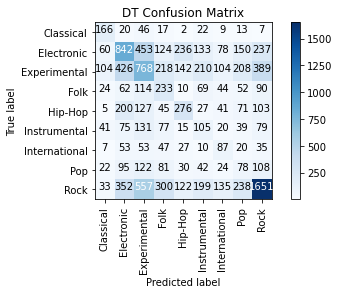

In [120]:
fullbest_confusion_matrix = metrics.confusion_matrix(label_test_full,pred_labels_treeos_pcahyper)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(fullbest_confusion_matrix, labelNames)
plt.show()

In [121]:
print('fullbest tree accuracy:', metrics.accuracy_score(label_test_full, pred_labels_treeos_pcahyper))
print('fullbest tree precision:', metrics.precision_score(label_test_full, pred_labels_treeos_pcahyper, average='weighted'))
print('fullbest tree recall:', metrics.recall_score(label_test_full, pred_labels_treeos_pcahyper, average='weighted'))
print('fullbest tree f1 score:', metrics.f1_score(label_test_full, pred_labels_treeos_pcahyper, average='weighted'))

fullbest tree accuracy: 0.35383191722049295
fullbest tree precision: 0.39238046365805745
fullbest tree recall: 0.35383191722049295
fullbest tree f1 score: 0.36749013939905695


In [122]:
ovr_treeos_pcahyper = OneVsRestClassifier(treeos_pcahyper)

ovr_treeos_pcahyper.fit(reduced_train_features2, oversample_label_train)

label_pred_ovr_treeos_pcahyper = ovr_treeos_pcahyper.predict(reduced_test_features)
label_pred_ovr_treeospcahyper_probability = ovr_treeos_pcahyper.predict_proba(reduced_test_features)

C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\multiclass.py:422: RuntimeWarning: invalid value encountered in true_divide
  Y /= np.sum(Y, axis=1)[:, np.newaxis]


In [123]:
auc_score = roc_auc_score(label_test_full, label_pred_ovr_treepcahyper_probability, multi_class = 'ovr')
print(auc_score)

0.7891723551096388


## DT: Undersample + PCA + Hyper

In [124]:
# Train our decision tree with best estimator
treeus_pcahyper = DecisionTreeClassifier(max_depth=10, min_samples_leaf=100, random_state=10)
treeus_pcahyper.fit(reduced_train_features3, undersample_label_train)

# Predict the labels for the test data
pred_labels_treeus_pcahyper = treeus_pcahyper.predict(reduced_test_features)

In [125]:
from sklearn import tree
fig = plt.figure(figsize=(100,80))
_ = tree.plot_tree(treeus_pcahyper,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

[[ 161    4  117    5    2    0    0    0   13]
 [  24  945  729   24  307    0    0    0  284]
 [  90  295 1492   40   94    0    0    0  558]
 [  23   30  283  171   42    0    0    0  149]
 [   2  253  188    4  344    0    0    0  104]
 [  55   45  368   13   17    0    0    0   84]
 [   8   33  156   26   41    0    0    0   75]
 [  13   75  241   24   65    0    0    0  184]
 [  12  180  584   27  138    0    0    0 2646]]


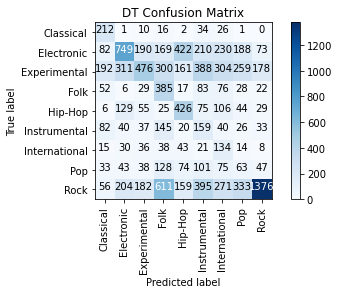

In [126]:
fullbest_confusion_matrix = metrics.confusion_matrix(label_test_full,pred_labels_treeus_pcahyper)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(fullbest_confusion_matrix, labelNames)
plt.show()

In [127]:
print('fullbest tree accuracy:', metrics.accuracy_score(label_test_full, pred_labels_treeus_pcahyper))
print('fullbest tree precision:', metrics.precision_score(label_test_full, pred_labels_treeus_pcahyper, average='weighted'))
print('fullbest tree recall:', metrics.recall_score(label_test_full, pred_labels_treeus_pcahyper, average='weighted'))
print('fullbest tree f1 score:', metrics.f1_score(label_test_full, pred_labels_treeus_pcahyper, average='weighted'))

fullbest tree accuracy: 0.33481955076974845
fullbest tree precision: 0.48486104319052514
fullbest tree recall: 0.33481955076974845
fullbest tree f1 score: 0.361921273803776


In [128]:
ovr_treeus_pcahyper = OneVsRestClassifier(treeus_pcahyper)

ovr_treeus_pcahyper.fit(reduced_train_features3, undersample_label_train)

label_pred_ovr_treeus_pcahyper = ovr_treeus_pcahyper.predict(reduced_test_features)
label_pred_ovr_treeuspcahyper_probability = ovr_treeus_pcahyper.predict_proba(reduced_test_features)

In [129]:
auc_score = roc_auc_score(label_test_full, label_pred_ovr_treeuspcahyper_probability, multi_class = 'ovr')
print(auc_score)

0.7531290794376934


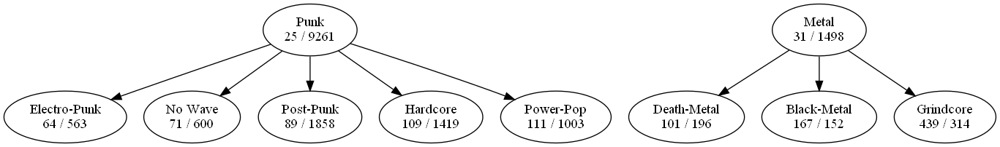

In [130]:
g = utils.Genres(genres)
graph = g.create_tree([25, 31], 1)
ipd.Image(graph.create_png())

In [131]:
graph = g.create_tree(14)
graph.write_pdf('genre_hierarchy.pdf');

roots = g.find_roots()
print('{} roots'.format(len(roots)))
graph = g.create_tree(roots)
graph.write_pdf('genre_hierarchy.pdf');

16 roots


## Cross Appearance

In [132]:
enc = MultiLabelBinarizer()
genres_indicator = enc.fit_transform(tracks['track', 'genres'])
genres_names = enc.classes_
genres_names = genres.loc[enc.classes_, 'title'].values
cross_correlation = genres_indicator.T @ genres_indicator

<ipython-input-133-8c6e1492d0d4>:4: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(cross_correlation))


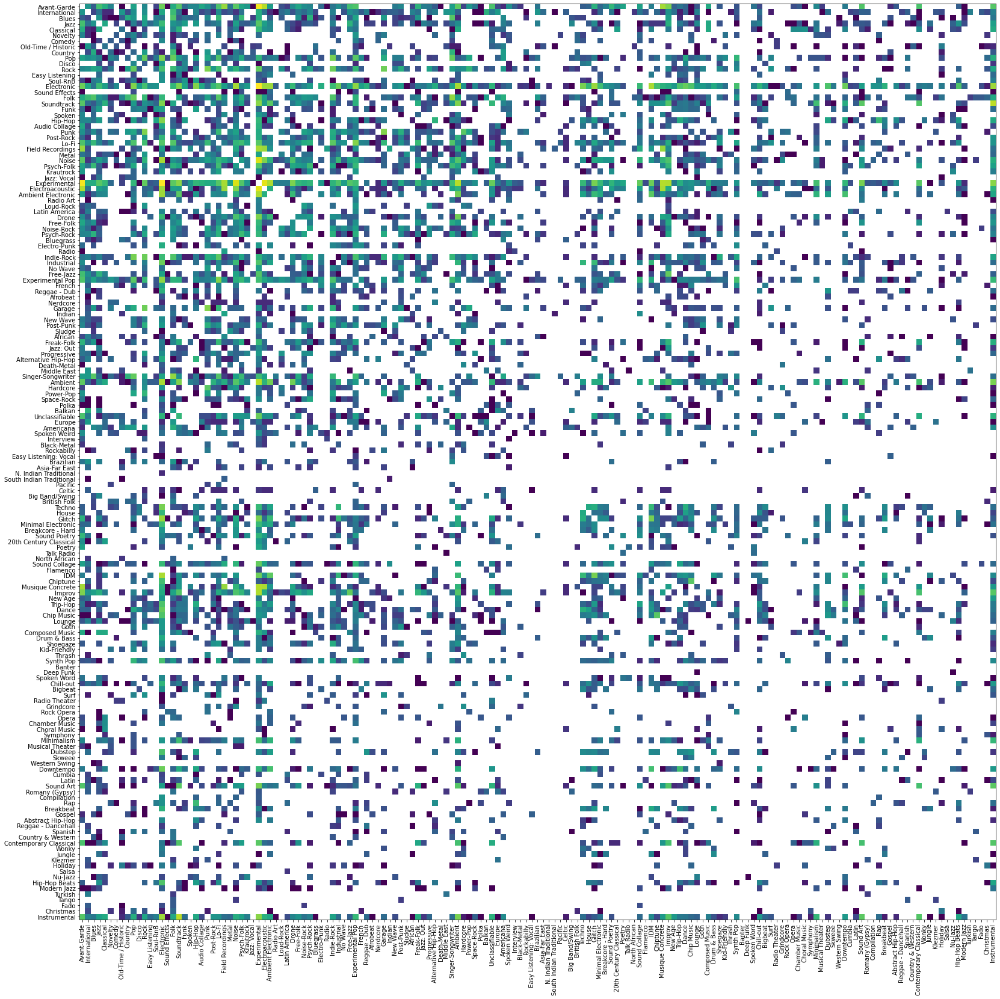

In [133]:
np.fill_diagonal(cross_correlation, 0)

plt.figure(figsize=(28, 28))
plt.imshow(np.log(cross_correlation))
plt.yticks(range(len(genres_names)), genres_names);
plt.xticks(range(len(genres_names)), genres_names, rotation=90);

In [134]:
cross_correlation = np.tril(cross_correlation, k=-1)
sort = np.argsort(cross_correlation.flatten())

N = 20
indices = np.unravel_index(sort[:-N:-1], cross_correlation.shape)
for i, j in zip(*indices):
    print('{}: {} | {}'.format(cross_correlation[i, j], genres_names[i], genres_names[j]))

6771: Experimental | Electronic
6088: Experimental | Avant-Garde
4782: Electroacoustic | Experimental
4121: Experimental | Noise
2783: Instrumental | Soundtrack
2663: Ambient | Experimental
2555: Electroacoustic | Avant-Garde
2507: Musique Concrete | Experimental
2385: Improv | Experimental
2250: Ambient Electronic | Experimental
2230: IDM | Electronic
2183: Musique Concrete | Electroacoustic
2122: Experimental | Field Recordings
2099: Ambient | Electronic
2097: Noise | Electronic
2049: Musique Concrete | Avant-Garde
1888: Instrumental | Electronic
1838: Electroacoustic | Electronic
1834: Ambient Electronic | Electronic


#### Factor Analysis Attempt

In [22]:
#!pip install factor_analyzer
from factor_analyzer import FactorAnalyzer
import matplotlib.pyplot as plt

In [23]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(features)
chi_square_value, p_value

C:\Users\Daniel\anaconda3\lib\site-packages\factor_analyzer\factor_analyzer.py:118: RuntimeWarning: divide by zero encountered in log
  statistic = -np.log(corr_det) * (n - 1 - (2 * p + 5) / 6)
C:\Users\Daniel\anaconda3\lib\site-packages\scipy\stats\_continuous_distns.py:1266: RuntimeWarning: invalid value encountered in subtract
  return sc.xlogy(df/2.-1, x) - x/2. - sc.gammaln(df/2.) - (np.log(2)*df)/2.


(inf, nan)

In [24]:
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(features)
kmo_model

C:\Users\Daniel\anaconda3\lib\site-packages\factor_analyzer\utils.py:248: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn('The inverse of the variance-covariance matrix '


0.9250119552791152

In [28]:
# Create factor analysis object and perform factor analysis
fa = FactorAnalyzer()
fa.set_params(n_factors=25, rotation=None)
fa.fit(features)

# Check Eigenvalues
ev, v = fa.get_eigenvalues()
ev

array([6.31905665e+01, 3.58824702e+01, 2.17533254e+01, 1.72872333e+01,
       1.56319052e+01, 1.46854180e+01, 1.27932054e+01, 1.20828732e+01,
       1.13187866e+01, 1.08514481e+01, 9.63485558e+00, 8.50555746e+00,
       7.60883064e+00, 7.47201691e+00, 7.00770370e+00, 6.55462993e+00,
       5.94117085e+00, 5.34190526e+00, 4.96827790e+00, 4.54656684e+00,
       4.52354925e+00, 4.15385615e+00, 4.00302329e+00, 3.92582365e+00,
       3.75603502e+00, 3.69390990e+00, 3.58274935e+00, 3.45479684e+00,
       3.40414659e+00, 3.23283512e+00, 3.16189923e+00, 2.86696029e+00,
       2.81343125e+00, 2.71491342e+00, 2.62744203e+00, 2.57832131e+00,
       2.49675339e+00, 2.37686268e+00, 2.34874932e+00, 2.23424381e+00,
       2.20163086e+00, 2.14272437e+00, 2.08590719e+00, 2.05114984e+00,
       1.98073740e+00, 1.93573459e+00, 1.91839560e+00, 1.88736926e+00,
       1.84906691e+00, 1.79735862e+00, 1.70556820e+00, 1.69538870e+00,
       1.67954690e+00, 1.66562390e+00, 1.64038362e+00, 1.55940283e+00,
      

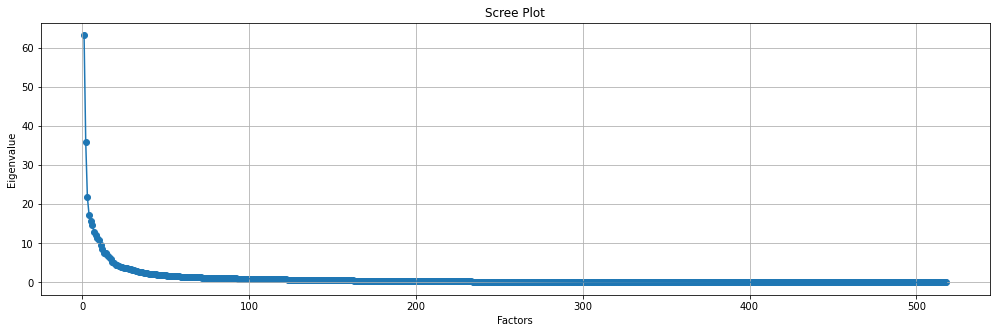

In [29]:
plt.scatter(range(1,features.shape[1]+1),ev)
plt.plot(range(1,features.shape[1]+1),ev)
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

In [ ]:
# Create factor analysis object and perform factor analysis
fa = FactorAnalyzer()
fa.set_params(n_factors=93, rotation="varimax")
fa.fit(features)


In [32]:
fa.loadings_

array([[-0.01333938,  0.00294747,  0.00793335, ..., -0.00407519,
         0.00577913,  0.0022522 ],
       [-0.01308647,  0.00637014,  0.00483356, ...,  0.00028363,
         0.01938886, -0.01680337],
       [-0.02719244, -0.00188223,  0.01377718, ..., -0.01145426,
        -0.01552292, -0.04069319],
       ...,
       [-0.06267149,  0.27019827, -0.09434547, ..., -0.01409513,
         0.00825383,  0.01765655],
       [-0.00767801, -0.04527562, -0.02167201, ...,  0.00805511,
        -0.00084478, -0.00574168],
       [ 0.24486629, -0.00582779,  0.10954146, ...,  0.06305201,
         0.03356163,  0.00292269]])

In [33]:
fa.get_factor_variance()


(array([31.88072553, 19.42098082, 19.06219641, 15.84402819, 14.79631715,
        13.34236797, 13.05399793, 12.93602143, 11.90814014, 11.8142155 ,
        11.51196699, 10.97415578,  8.2761672 ,  7.14936619,  6.21095059,
         6.2031118 ,  5.21655385,  5.20257715,  4.77122205,  4.70572226,
         4.56629869,  4.47917998,  4.2664065 ,  4.08103567,  4.01033139,
         3.76201616,  3.70141597,  3.52421779,  3.38135508,  3.25458216,
         3.23825222,  3.11703159,  3.10112412,  2.89130201,  2.8842373 ,
         2.78625134,  2.78296342,  2.7370628 ,  2.68247612,  2.6643914 ,
         2.61002346,  2.58044489,  2.58036965,  2.57794039,  2.54075   ,
         2.50807697,  2.47871705,  2.45398232,  2.45155639,  2.41906096,
         2.41238293,  2.38111198,  2.36333657,  2.36283053,  2.33362627,
         2.32381754,  2.22587688,  2.20444503,  2.16795522,  2.06172854,
         2.04363741,  2.02764714,  1.91694028,  1.89247858,  1.88693248,
         1.86016132,  1.81201864,  1.7946966 ,  1.7

In [ ]:
# histograms of the variables
chroma_cens_kurtosis = features.columns[:11]
features.hist(column=chroma_cens)
plt.show()

In [ ]:
chroma_cens_max = features.columns[12:24]
features.hist(column=chroma_cens_max)
plt.show()

In [ ]:
chroma_cens_all1 = features.columns[:42]
chroma_cens_all2 = features.columns[43:84]
features.hist(column=chroma_cens_all1)
plt.show()

#### Finding Feature Importance 

In [85]:
## Calculating feature importance
feat_importance = tree_pcahyper.tree_.compute_feature_importances(normalize=False)
feat_imp_dict = dict(zip(feature_train_full, tree_pcahyper.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.rename(columns = {0:'FeatureImportance'}, inplace = True)
feat_imp.sort_values(by=['FeatureImportance'], ascending=False).head()

,FeatureImportance
"(chroma_cens, kurtosis, 02)",0.238497
"(chroma_cens, kurtosis, 01)",0.169965
"(chroma_cens, kurtosis, 05)",0.145194
"(chroma_cens, kurtosis, 07)",0.056438
"(chroma_cens, max, 02)",0.048456


In [160]:
from sklearn.model_selection import KFold, cross_val_score

# Set up our K-fold cross-validation
kf = KFold(n_splits=10)

#tree = DecisionTreeClassifier(random_state=10)

# Train our models using KFold cv
tree_score = cross_val_score(tree_pcahyper, X, y, cv=kf)

# Print the mean of each array of scores
print("Decision Tree:", np.mean(tree_score))

Decision Tree: 0.5128384708521507


In [ ]:
# number of components
n_pcs= tree_pcahyper.components_.shape[0]

# get the index of the most important feature on EACH component
# LIST COMPREHENSION HERE
most_important = [np.abs(tree_pcahyper.components_[i]).argmax() for i in range(n_pcs)]

#initial_feature_names = ['a','b','c','d','e']
# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]

# LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

# build the dataframe
df = pd.DataFrame(dic.items())